In [ ]:
# Goal: Practice low-level audio signal processing tasks like framing, feature extraction, and 
# generating spectrograms on human speech, animal sound, infrasound, and ultrasound
# Tasks include:
# -	Load audio
# -	Visualize waveforms
# -	Extract and visualize time-domain features (amplitude envelope, root mean square energy, zero-crossing rate)
# -	Use amplitude envelope in simple VAD-like task (extract a single quack from a duck audio) 
# -	Apply Short-Time Fourier Transform and compare frame lengths to optimize frequency-time resolution for different types of sound
# -	Visualize spectrograms, apply linear, log, and mel scales to frequency
# -	Apply a filter to ultrasound to remove the lower frequencies
# -	Extract MFCCS and visualize change over time
# -	Extract and visualize spectral centroid and bandwidth

# Date last updated: 1/14/2025
# Author: Kay Rubio

In [588]:
# Ensure not using latest python 3.13 which doesn't currently work with librosa
!python3 --version

Python 3.12.8


In [607]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import soundfile as sf

In [28]:
## Load and explore audio files

In [610]:
audio_folder = "Sounds/sample_audios/"

# Load audio with Librosa.load which automatically resamples at sr=22050
convo, sr_convo = librosa.load(audio_folder+"convo.wav") # example human convo
singingwoman, sr_singingwoman = librosa.load(audio_folder+"singingwoman.wav") # example human singing
party, sr_party = librosa.load(audio_folder+"party.wav") # example human party noise with many voices
duck, sr_duck = librosa.load(audio_folder+"duck.wav") # example simple monotone animal sound
chicken, sr_chicken = librosa.load(audio_folder+"chicken.wav") # example animal sound with a little more variation
spermwhale, sr_spermwhale = librosa.load(audio_folder+"spermwhale.wav") # example animal sound with super fast clicking
elephants, sr_elephants = librosa.load(audio_folder+"elephants.wav") # low infrasonic elephant rumbles

# Load ultrasound audio files, retain original sample rate
bat, sr_bat = librosa.load(audio_folder+"bat.wav", sr=None) # ultrasonic bat echolocation calls
dolphin, sr_dolphin = librosa.load(audio_folder+"dolphin.wav", sr=None) # dolphin whistles and clicks that enter ultrasonic range

In [24]:
# Check the sample rate of some audio
sr_duck

22050

In [27]:
sr_bat

384000

In [369]:
sr_elephants

2000

In [17]:
# Listen to an audio file in notebook using IPython.display
ipd.Audio(audio_folder+"duck.wav")

In [18]:
# Check the shape of an audio file, which should show total number of samples
duck.shape

(265484,)

In [31]:
bat.shape

(4618579,)

In [40]:
# Check the sample duration of one file
sample_duration = 1 / sr_duck
print(f"One sample of duck audio lasts for {sample_duration:.7f} seconds")

One sample of duck audio lasts for 0.0000454 seconds


In [39]:
# Check the sample duration of ultrasound file with higher sr (should be way smaller)
sample_duration = 1 / sr_bat
print(f"One sample of bat audio lasts for {sample_duration:.7f} seconds")

One sample of bat audio lasts for 0.0000026 seconds


In [38]:
# Check total length of audio file in seconds
duration_duck = 1 / sr_duck * len(duck)
print(f"The duck audio lasts for {duration_duck:.2f} seconds")

The duck audio lasts for 12.04 seconds


In [41]:
duration_bat = 1 / sr_bat * len(bat)
print(f"The bat audio lasts for {duration_bat:.2f} seconds")

The bat audio lasts for 12.03 seconds


In [ ]:
## Visualize waveforms

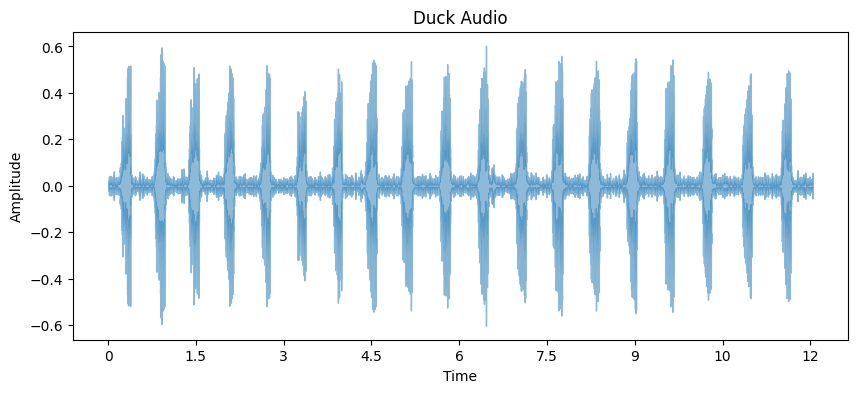

In [57]:
# plot 1 waveform
plt.figure(figsize=(10, 4))
librosa.display.waveshow(duck, sr=sr_duck, alpha=0.5)
plt.title("Duck Audio")
plt.xlabel("Time (sec)") 
plt.ylabel("Amplitude")
plt.show()

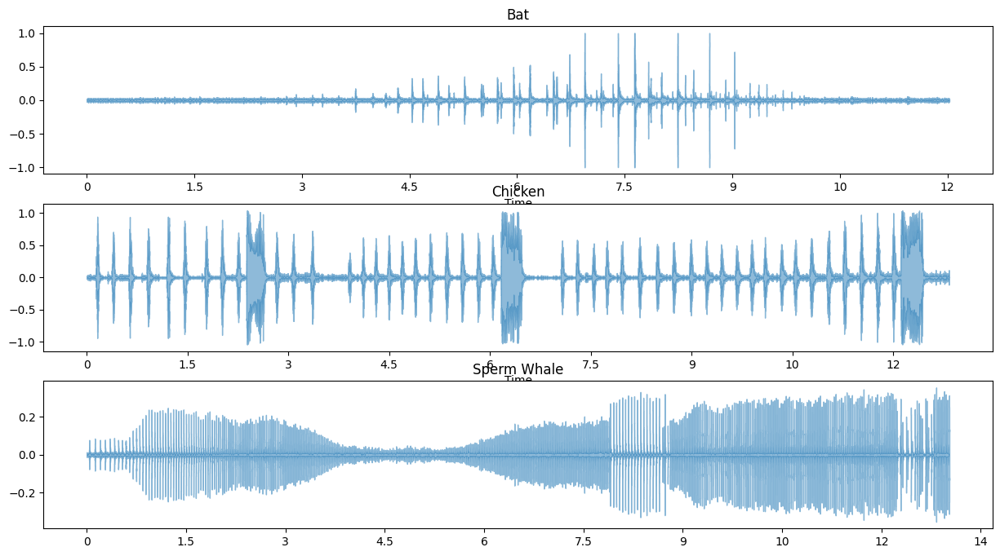

In [66]:
# Plot 3 waveforms in 1 figure
plt.figure(figsize=(15, 8))

plt.subplot(3, 1, 1) # create subplots of 3 files
librosa.display.waveshow(bat, sr=sr_bat, alpha=0.5)
plt.title("Bat")

plt.subplot(3, 1, 2)
librosa.display.waveshow(chicken, sr=sr_chicken, alpha=0.5)
plt.title("Chicken")

plt.subplot(3, 1, 3)
librosa.display.waveshow(spermwhale, sr=sr_spermwhale, alpha=0.5)
plt.title("Sperm Whale")

plt.show()

In [ ]:
## Amplitude Envelope

In [439]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [68]:
# Function to calculate amplitude envelope for each frame
def amplitude_envelope(audio, frame_size, hop_length):
    return np.array([max(audio[i:i+frame_size]) for i in range(0, len(audio), hop_length)])

In [69]:
# Calculate Amplitude Envelope on the duck audio and check length of the result
ae_duck = amplitude_envelope(duck, FRAME_SIZE, HOP_LENGTH)
len(ae_duck)

519

In [70]:
frames = range(len(ae_duck))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

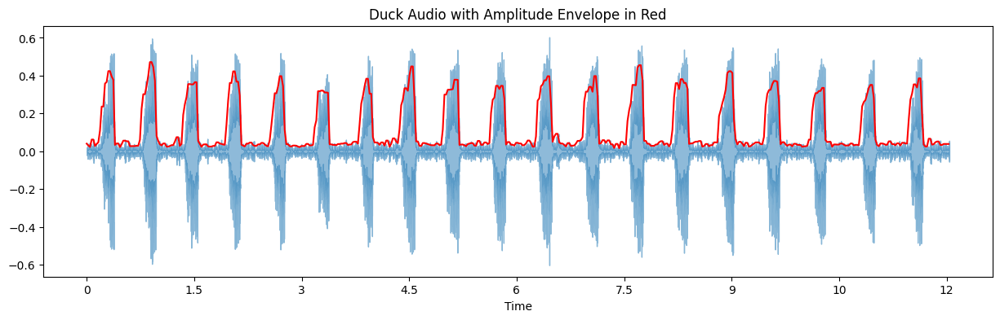

In [75]:
#Draw amplitude envelope onto waveform
plt.figure(figsize=(15, 4))

librosa.display.waveshow(duck, sr=sr_duck, alpha=0.5)
plt.plot(t, ae_duck, color="r")
plt.title("Duck Audio with Amplitude Envelope in Red")
plt.show()


In [428]:
# Use amplitude envelope to isolate a single quack. From the diagram above, a quack could
# be considered to frames with values above 0.08, where frames with AE's below 0.08 are
# just background noise. Looking at the AE values for the first 20 frames:
ae_duck[:20]

array([0.04020426, 0.03039332, 0.02253707, 0.06173735, 0.06173735,
       0.02760175, 0.03868768, 0.04716518, 0.10967383, 0.23637499,
       0.23637499, 0.35772783, 0.36630195, 0.42388   , 0.42388   ,
       0.39554363, 0.37775105, 0.03371273, 0.04104405, 0.04104405],
      dtype=float32)

In [501]:
ae_cutoff_for_sound = 0.14
start_frame = int(np.argmax(ae_duck > ae_cutoff_for_sound))-1
start_frame

8

In [502]:
# To find the end of the first quack, find the first value after the starting frame that is below
# the cutoff, then take the one right before it that was still above the cutoff
end_frame = int(np.argmax(ae_duck[starting_frame:] < ae_cutoff_for_sound))+starting_frame-1
end_frame

16

In [503]:
# Trim audio file to just one quack using these starting and ending frames
# Convert frame indices to sample indices
start_sample = start_frame * HOP_LENGTH
end_sample = (end_frame * HOP_LENGTH) + FRAME_SIZE

4096

In [505]:
# Trim the audio signal
duck_trimmed = duck[start_sample:end_sample]

In [513]:
# Check total length of audio file in seconds
duration_duck_trimmed = 1 / sr_duck * len(duck_trimmed)
print(f"The duck quack lasts for {duration_duck_trimmed:.3f} seconds")

The duck quack lasts for 0.232 seconds


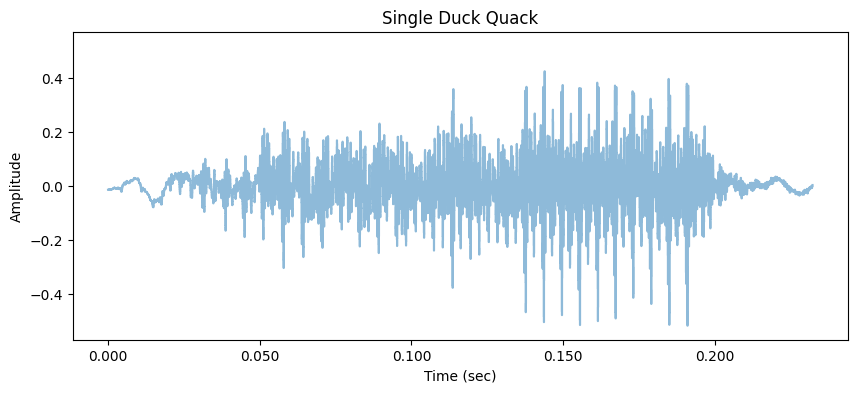

In [508]:
# Plot the waveform of a single quack
plt.figure(figsize=(10, 4))
librosa.display.waveshow(duck_trimmed, sr=sr_duck, alpha=0.5)
plt.title("Single Duck Quack")
plt.xlabel("Time (sec)") 
plt.ylabel("Amplitude")
plt.show()

In [ ]:
## Root mean square energy

In [86]:
# Calculate rms as array using librosa.feature.rms and check the size of the resulting array
rms_duck = librosa.feature.rms(y=duck, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
len(rms_duck)

519

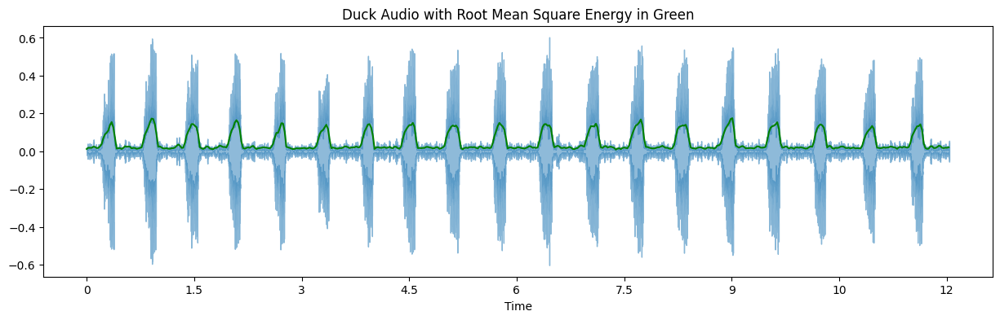

In [85]:
#Draw root mean square energy onto waveform
plt.figure(figsize=(15, 4))
librosa.display.waveshow(duck, sr=sr_duck, alpha=0.5)
plt.plot(t, rms_duck, color="g")
plt.title("Duck Audio with Root Mean Square Energy in Green")
plt.show()

In [ ]:
## Zero-crossing rate

In [88]:
zcr_duck = librosa.feature.zero_crossing_rate(y=duck, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
len(zcr_duck)

519

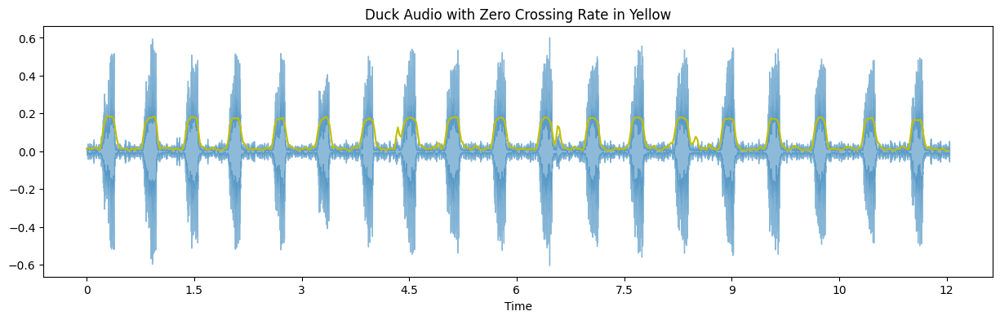

In [90]:
#Draw zero crossing rate onto waveform
plt.figure(figsize=(15, 4))
librosa.display.waveshow(duck, sr=sr_duck, alpha=0.5)
plt.plot(t, zcr_duck, color="y")
plt.title("Duck Audio with Zero Crossing Rate in Yellow")
plt.show()

In [98]:
# Comparing the zero crossing rate of human speech vs singing
zcr_singingwoman = librosa.feature.zero_crossing_rate(y=singingwoman, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_convo = librosa.feature.zero_crossing_rate(y=convo, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_party = librosa.feature.zero_crossing_rate(y=party, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [93]:
# Check the length of each zcr array
len(zcr_singingwoman)

564

In [96]:
len(zcr_convo)

557

In [99]:
len(zcr_party)

563

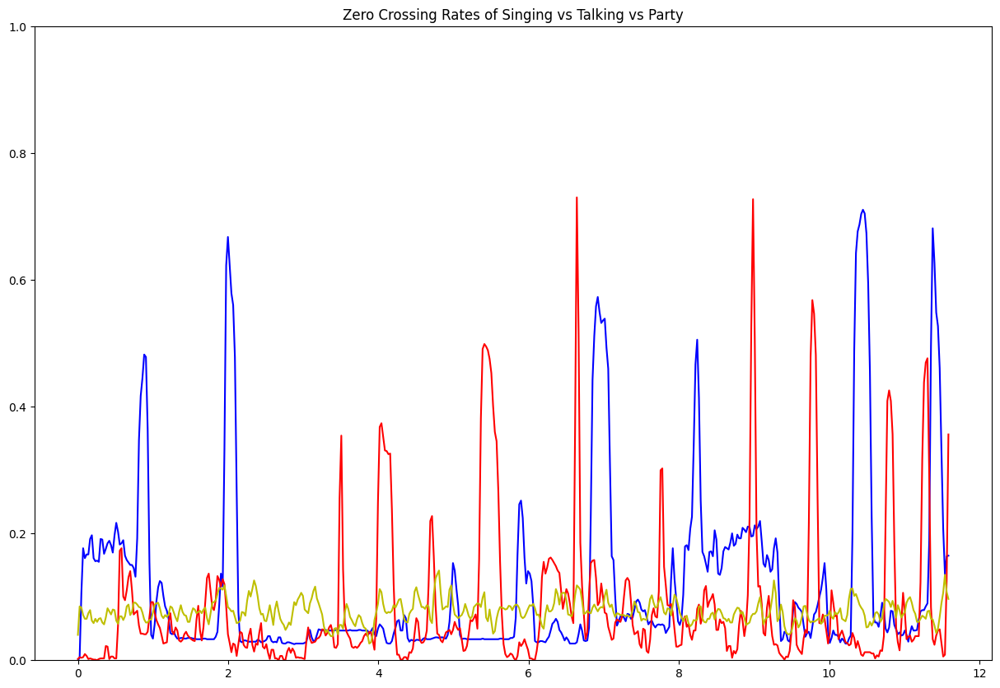

In [100]:
#Comparing the zero crossing rate of 3 different audio files
# For plotting purposes, use only first 500 frames
plt.figure(figsize=(15, 10))

plt.plot(t[:500], zcr_singingwoman[:500], color="b")
plt.plot(t[:500], zcr_convo[:500], color="r")
plt.plot(t[:500], zcr_party[:500], color="y")
plt.ylim(0, 1)
plt.title("Zero Crossing Rates of Singing vs Talking vs Party")
plt.show()

In [ ]:
## Apply the Short-Time Fourier Transform and plot spectrograms

In [168]:
# Create method to easily plot spectrograms
def plot_spectrogram(Y, sr, hop_length, y_axis="mel", fmin=0, fmax=20000):
    plt.figure(figsize=(25, 10)) # instantiate a figure and give a size
    # use librosa.display.specshow to visualize any type of spectrogram
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis
		)
    plt.ylim(fmin, fmax)
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')    
    plt.colorbar(format="%+2.f") # add a color bar legend
    plt.title('Spectrogram')
    plt.show()

In [182]:
# Create method to easily plot spectrograms AND zoom in on the x-axis
def plot_spectrogram_zoom(Y, sr, hop_length, y_axis="mel", fmin=0, fmax=20000, xmin=0, xmax=12):
    plt.figure(figsize=(25, 10)) # instantiate a figure and give a size
    # use librosa.display.specshow to visualize any type of spectrogram
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis
		)
    plt.ylim(fmin, fmax)
    plt.xlim(xmin, xmax)
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')    
    plt.colorbar(format="%+2.f") # add a color bar legend
    plt.title('Spectrogram')
    plt.show()

In [659]:
# Plot spectrogram for human conversation
# For a human conversation, librosa recommends 512 to prioritize time resolution, although
# found that 1024 and 2048 also look OK
FRAME_LENGTH = 512

In [660]:
HOP_LENGTH = FRAME_LENGTH//4

In [661]:
# Extract Short-Time Fourier Transform, which will be a matrix of numbers
stft_convo = librosa.stft(convo, n_fft=FRAME_LENGTH, hop_length=HOP_LENGTH)
stft_convo.shape

(257, 2228)

In [673]:
# Check output type, should be complex number containing phase & amplitude
type(stft_convo[0][0])

numpy.complex64

In [662]:
# Remove complex numbers, retain just amplitude, and choose between amplitude or power spectrograms
# stft_convo_abs = np.abs(stft_convo) # use for an amplitude spectrogram
stft_convo_abs = np.abs(stft_convo) ** 2 # use for a power spectrogram

In [674]:
# Optionally check array, shape, and first value to ensure no longer complex
type(stft_convo_abs[0][0])

numpy.float32

In [663]:
# Transform amplitude OR power from linear to log scale decibels to improve visualization
stft_convo_dB = librosa.power_to_db(np.abs(stft_convo_abs), ref=np.max)
# stft_convo_dB = librosa.amplitude_to_db(np.abs(stft_convo_abs), ref=np.max)

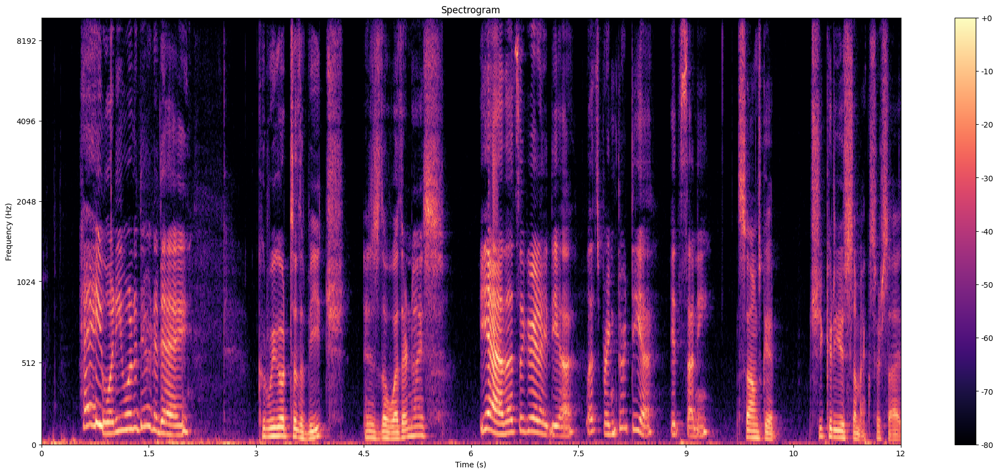

In [664]:
# Plot spectrogram, use the mel scale for frequency that is more similar to how humans hear sound since this is a convo
plot_spectrogram(stft_convo_dB, sr_convo, HOP_LENGTH, "mel", 0, 10000)

In [107]:
# For simple duck audio, use default for music, balancing time/frequency resolution
FRAME_LENGTH = 2048
HOP_LENGTH = 512

In [108]:
stft_duck = librosa.stft(duck, n_fft=FRAME_LENGTH, hop_length=HOP_LENGTH)
stft_duck.shape

(1025, 519)

In [139]:
stft_duck_abs = np.abs(stft_duck) ** 2

In [144]:
stft_duck_dB = librosa.power_to_db(np.abs(stft_duck_abs), ref=np.max)

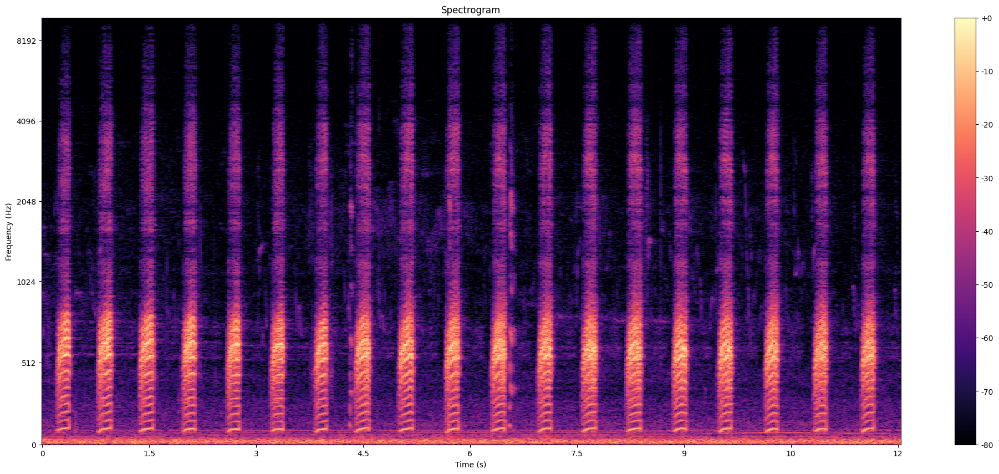

In [150]:
plot_spectrogram(stft_duck_dB, sr_duck, HOP_LENGTH, "mel", 0, 10000)

In [665]:
# Plot spectrogram for sperm whales who make rapid clicks and may need to prioritize time resolution
FRAME_LENGTH = 256
# Note: 128 worked OK  here too but 256 seems like the best balance between frequency and time. 512 doesn't give
# enough time resoultion to separate these super fast clicks

In [666]:
HOP_LENGTH = FRAME_LENGTH//4

In [667]:
stft_spermwhale = librosa.stft(spermwhale, n_fft=FRAME_LENGTH, hop_length=HOP_LENGTH)
stft_spermwhale_abs = np.abs(stft_spermwhale) ** 2
stft_spermwhale_dB = librosa.power_to_db(np.abs(stft_spermwhale_abs), ref=np.max)

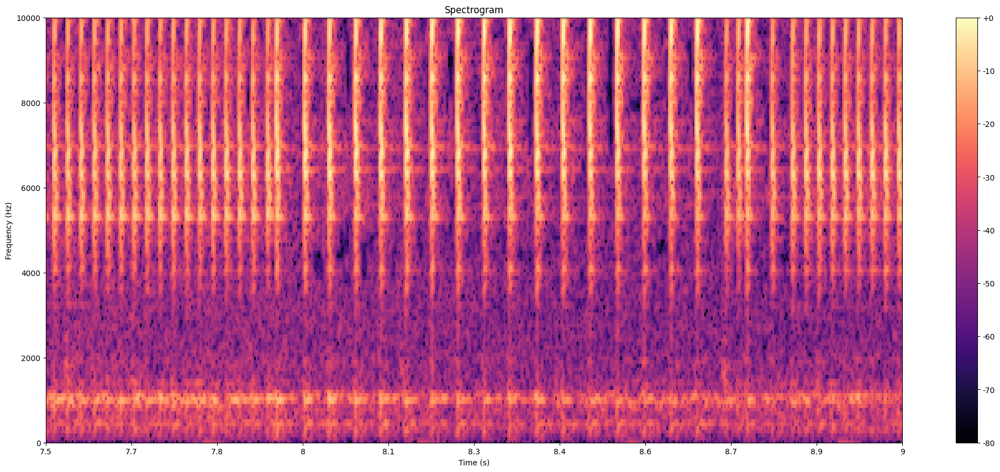

In [668]:
# plot spectrogram and zoom in on 7.5-9 seconds so you can really see individual clicks
plot_spectrogram_zoom(stft_spermwhale_dB, sr_spermwhale, HOP_LENGTH, "linear", 0, 10000, 7.5, 9)

In [ ]:
## Spectrograms and filtering for high frequencies for ultrasound

In [669]:
# Plot spectrogram for dolphin audio which has a higher sampling rate of 60,600 Hz
# Given sample rate of 60,600 Hz, frame length of 4096 corresponds to a frame duration of 68ms
FRAME_LENGTH = 4096

In [670]:
HOP_LENGTH = FRAME_LENGTH//4

In [671]:
stft_dolphin = librosa.stft(dolphin, n_fft=FRAME_LENGTH, hop_length=HOP_LENGTH)
stft_dolphin_abs = np.abs(stft_dolphin) ** 2
stft_dolphin_dB = librosa.power_to_db(np.abs(stft_dolphin_abs), ref=np.max)

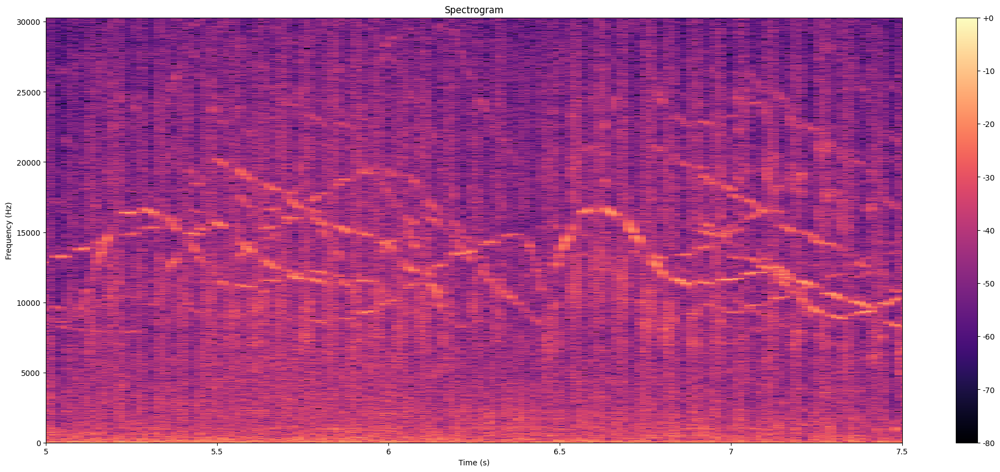

In [672]:
# Plot spectrogram and zoom in on x-axis. Can see both whistles and clicks at the same time
plot_spectrogram_zoom(stft_dolphin_dB, sr_dolphin, HOP_LENGTH, "linear", 0, 30300, 5, 7.5)

In [ ]:
# Based on trying different frame sizes, seems hard to really capture dolphin sound. Those super-fast clicks need 
# good time resolution, but the high-frequency whistles also require good frequency resolution

In [357]:
# Plot spectrogram for bat ultrasound
FRAME_LENGTH_US = 2048
# Note: tried 4096 and 8192 but the time resolution was really bad
# so 4096 seems like the best balance for bat ultrasound

In [358]:
HOP_LENGTH_US = FRAME_LENGTH_US//4

In [675]:
stft_bat = librosa.stft(bat, n_fft=FRAME_LENGTH_US, hop_length=HOP_LENGTH_US)
stft_bat.shape

(1025, 9021)

In [361]:
stft_bat_abs = np.abs(stft_bat) ** 2
stft_bat_dB = librosa.power_to_db(np.abs(stft_bat_abs), ref=np.max)

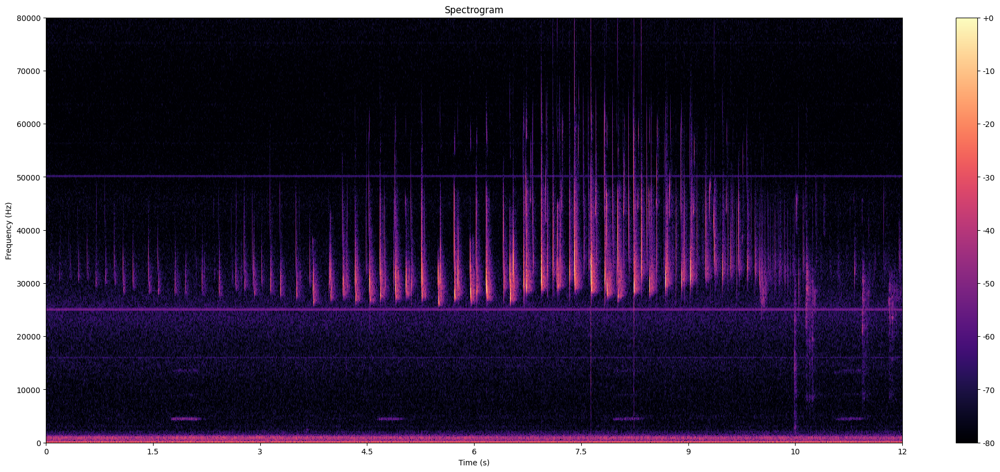

In [590]:
# Plot spectrogram for bats
plot_spectrogram(stft_bat_dB, sr_bat, HOP_LENGTH_US, "linear", 0, 80000)

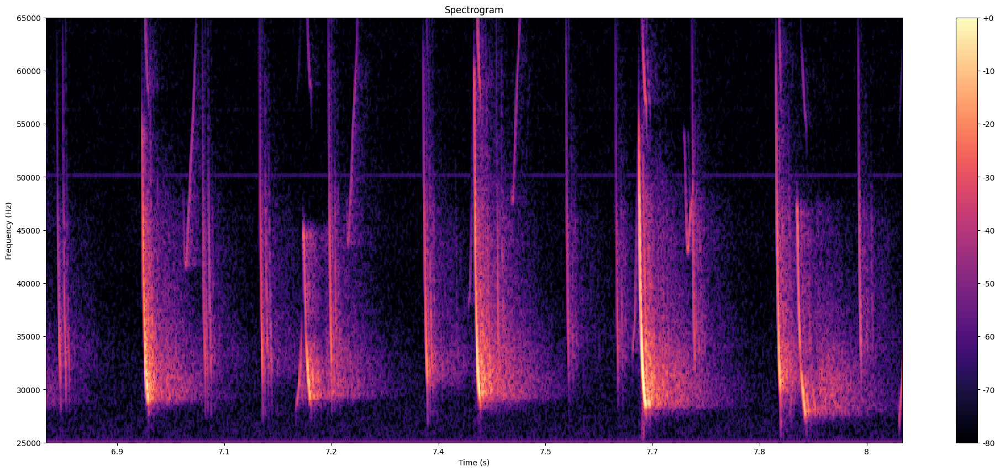

In [363]:
# Zoom in on highest frequencies and zoom in on time a bit to see more detail
plot_spectrogram_zoom(stft_bat_dB, sr_bat, HOP_LENGTH_US, "linear", 25000, 65000, 6.8, 8)

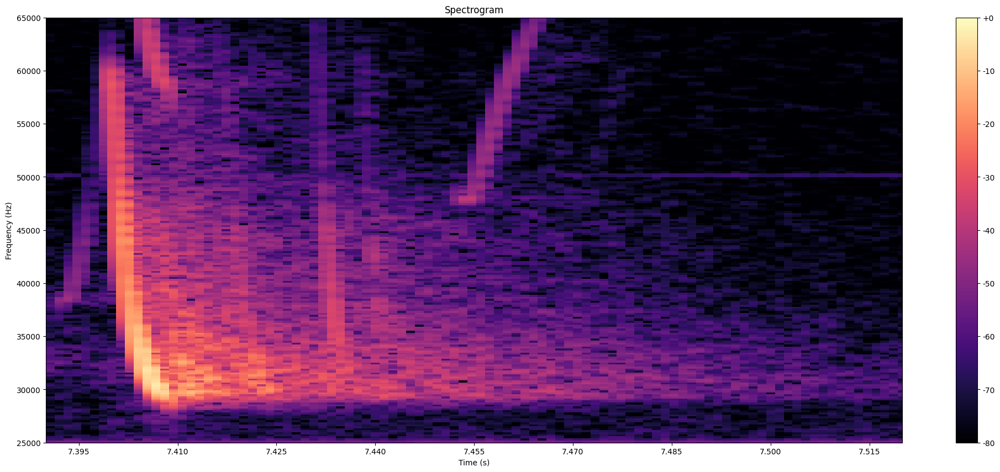

In [576]:
# Zoom in on a single bat call
plot_spectrogram_zoom(stft_bat_dB, sr_bat, HOP_LENGTH_US, "linear", 25000, 65000, 7.39, 7.52)

In [591]:
# All bat energy is between 25,000 - 80,000 Hz, but there is also background noise and insect chirps at much lower frequencies
# Apply a cutoff, and zero out all the values below 25,000 Hz to isolate the bat sounds
CUTOFF_US = 25000

In [596]:
# Get the frequency values corresponding to the rows of the STFT
bat_frequencies = librosa.fft_frequencies(sr=sr_bat, n_fft=FRAME_LENGTH_US)
bat_frequencies

array([0.000000e+00, 1.875000e+02, 3.750000e+02, ..., 1.916250e+05,
       1.918125e+05, 1.920000e+05])

In [597]:
# Find the index of the frequency closest to 30,000 Hz
cutoff_idx = np.argmax(bat_frequencies >= CUTOFF_US)
cutoff_idx

np.int64(134)

In [594]:
# Create a copy of the STFT matrix
stft_bat_filtered = stft_bat.copy()

In [595]:
# Zero out frequencies below cutoff
stft_bat_filtered[:cutoff_idx, :] = 0

In [599]:
# Remove complex numbers, retain just amplitude, and choose between amplitude or power spectrograms
stft_bat_filtered_abs = np.abs(stft_bat_filtered) ** 2 # use for a power spectrogram

In [600]:
# Transform amplitude OR power from linear to log scale decibels to improve visualization
stft_bat_filtered_dB = librosa.power_to_db(np.abs(stft_bat_filtered_abs), ref=np.max)

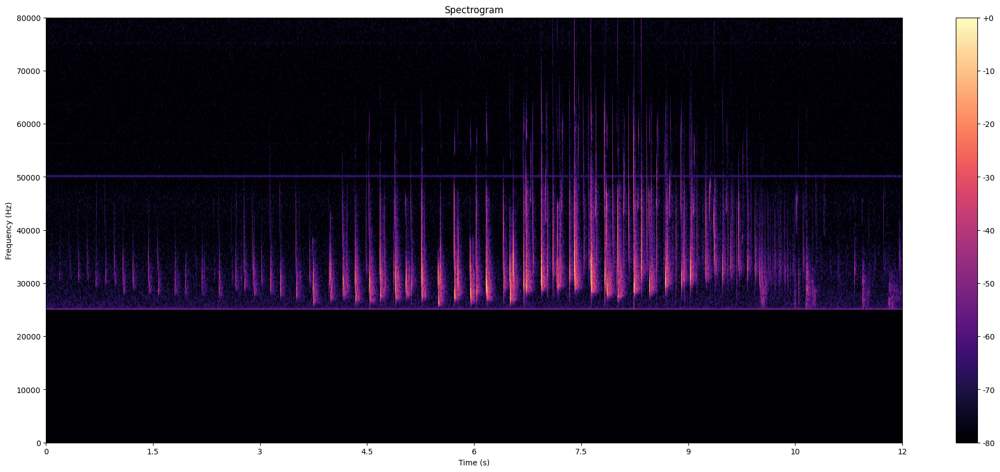

In [601]:
# Plot spectrogram for bats with lower frequency sounds filtered out
plot_spectrogram(stft_bat_filtered_dB, sr_bat, HOP_LENGTH_US, "linear", 0, 80000)

In [603]:
# Convert back to the time domain using the inverse STFT
bat_filtered = librosa.istft(stft_bat_filtered, hop_length=HOP_LENGTH_US)

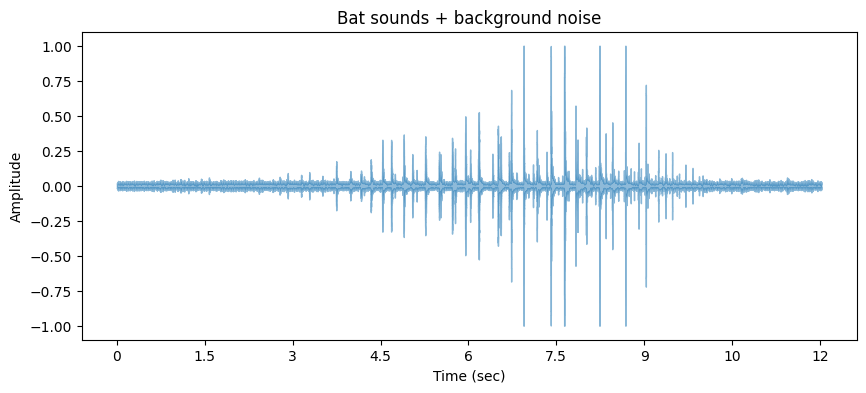

In [604]:
# Compare original bat waveform vs. filtered bat-sounds-only waveform
# Plot the waveform of bats with background noise
plt.figure(figsize=(10, 4))
librosa.display.waveshow(bat, sr=sr_bat, alpha=0.5)
plt.title("Bat sounds + background noise")
plt.xlabel("Time (sec)") 
plt.ylabel("Amplitude")
plt.show()

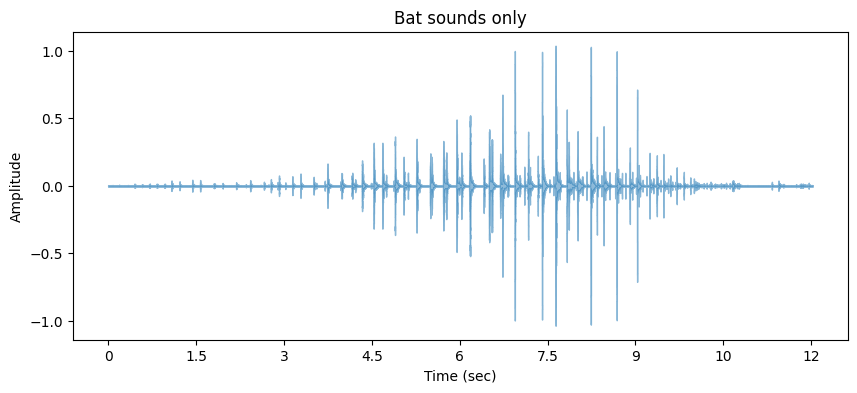

In [605]:
# Plot the waveform of bats without background noise
plt.figure(figsize=(10, 4))
librosa.display.waveshow(bat_filtered, sr=sr_bat, alpha=0.5)
plt.title("Bat sounds only")
plt.xlabel("Time (sec)") 
plt.ylabel("Amplitude")
plt.show()

In [ ]:
## Spectrograms and resampling for infrasound

In [630]:
# Plot spectrogram for elephant infrasound
FRAME_LENGTH_IS = 2048

In [631]:
HOP_LENGTH_IS = FRAME_LENGTH_IS//4

In [632]:
# Extract short-time fourier transform matrix
stft_elephants = librosa.stft(elephants, n_fft=FRAME_LENGTH_IS, hop_length=HOP_LENGTH_IS)
stft_elephants.shape

(1025, 565)

In [633]:
stft_elephants_abs = np.abs(stft_elephants) ** 2
stft_elephants_dB = librosa.power_to_db(np.abs(stft_elephants_abs), ref=np.max)

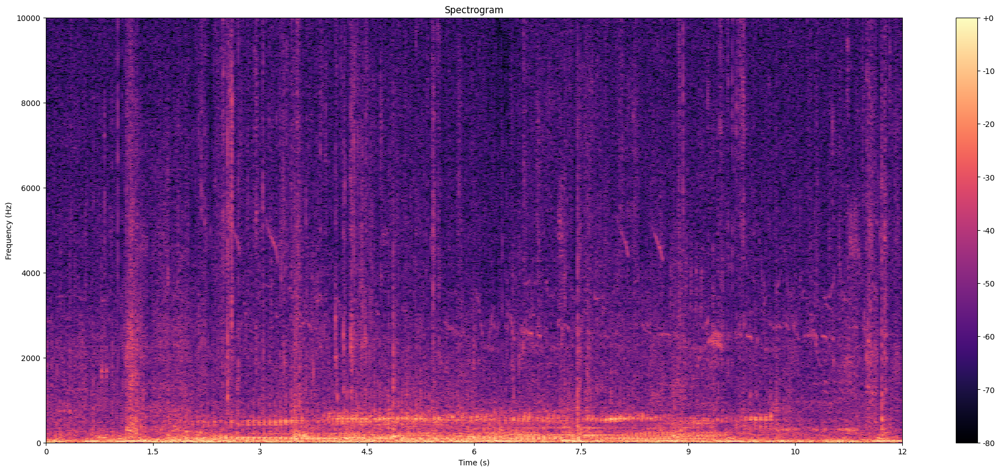

In [635]:
# Plot elephant rumbles
plot_spectrogram(stft_elephants_dB, sr_elephants, HOP_LENGTH_IS, "linear", 0, 10000)

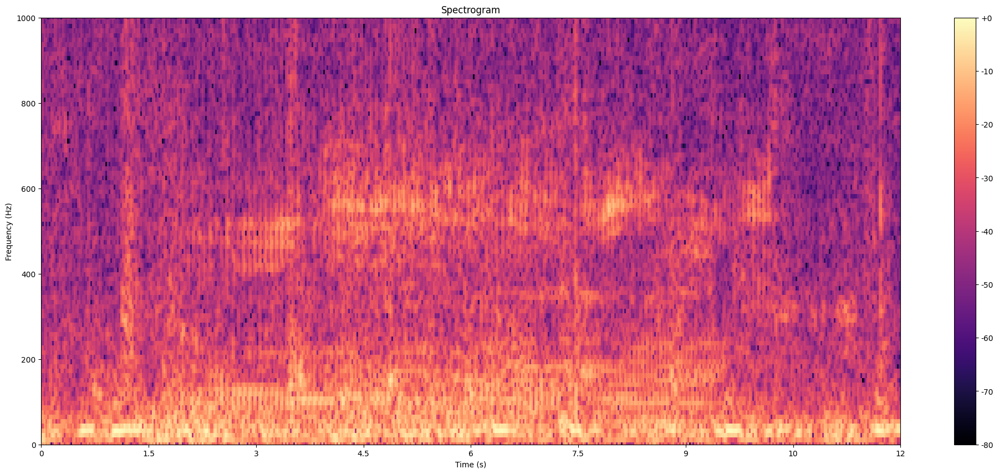

In [636]:
# Plot elephant rumbles but zoom in on lower frequencies
plot_spectrogram(stft_elephants_dB, sr_elephants, HOP_LENGTH_IS, "linear", 0, 1000)

In [644]:
# Plot spectrogram for elephant infrasound
FRAME_LENGTH_IS_LOW = 512

In [645]:
HOP_LENGTH_IS_LOW = FRAME_LENGTH_IS_LOW//4

In [646]:
# Try resampling elephant audio at 2000 Hz (Nyquist frequency of 1000 Hz)
SR_ELEPHANTS_LOW = 2000
elephants_low = librosa.resample(elephants, orig_sr=sr_elephants, target_sr=SR_ELEPHANTS_LOW)

In [655]:
stft_elephants_low = librosa.stft(elephants_low, n_fft=FRAME_LENGTH_IS_LOW, hop_length=HOP_LENGTH_IS_LOW)
stft_elephants_low.shape

(257, 205)

In [656]:
stft_elephants_low_abs = np.abs(stft_elephants_low) ** 2
stft_elephants_low_dB = librosa.power_to_db(np.abs(stft_elephants_low_abs), ref=np.max)

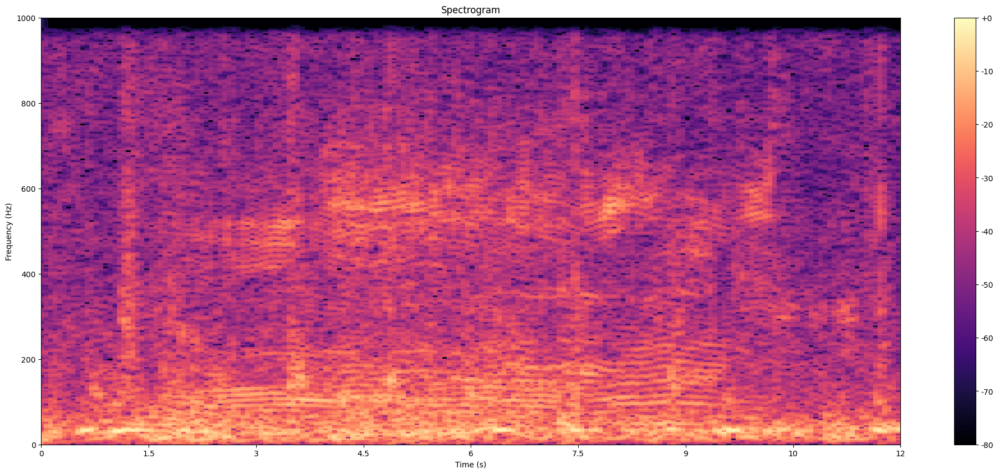

In [658]:
# Plot elephant rumbles
plot_spectrogram(stft_elephants_low_dB, SR_ELEPHANTS_LOW, HOP_LENGTH_IS_LOW, "linear", 0, 1000)

In [ ]:
# The visualization above really isn't much of an improvement, so resampling at a lower rate and trying
# different frame lengths didn't really help. Need to look more into infrasound, seems tricky.

In [ ]:
## Extract MFCCs and examine first 13

In [537]:
FRAME_LENGTH = 2048
HOP_LENGTH = 512

In [538]:
mfccs_duck_trimmed = librosa.feature.mfcc(y=duck_trimmed, sr=sr, n_fft=FRAME_LENGTH, hop_length=HOP_LENGTH, n_mfcc=13)
mfccs_duck_trimmed.shape

(13, 11)

In [529]:
# The output of mfcc is a matrix with 13 rows for the first 13 MFCCs, and 11 columns for 11 frames
# Look at the MFCCs at a frame in the middle
mfccs_duck_trimmed[:, 4]

array([-153.63104  ,  121.147964 ,  -90.005875 ,    7.200283 ,
         32.07282  ,   31.71837  ,  -46.825638 ,   38.066322 ,
         10.294548 ,    3.2575886,   -8.334806 ,    8.713611 ,
         -3.0736272], dtype=float32)

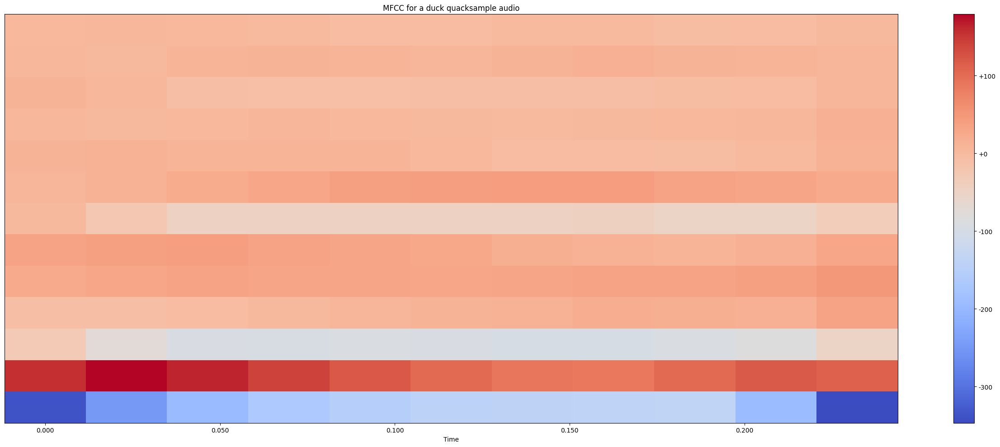

In [530]:
# Visualizing MFCCs
plt.figure(figsize=(25, 10))
librosa.display.specshow(mfccs_duck_trimmed, x_axis='time', sr=sr)
plt.colorbar(format="%+2.f") # format is optional argument
plt.title('MFCC for a duck quacksample audio')
plt.tight_layout()
plt.show()

In [531]:
# Computing first MFCCs derivatives (how they change from frame-frame over time)
delta_mfccs_duck_trimmed = librosa.feature.delta(mfccs_duck_trimmed)

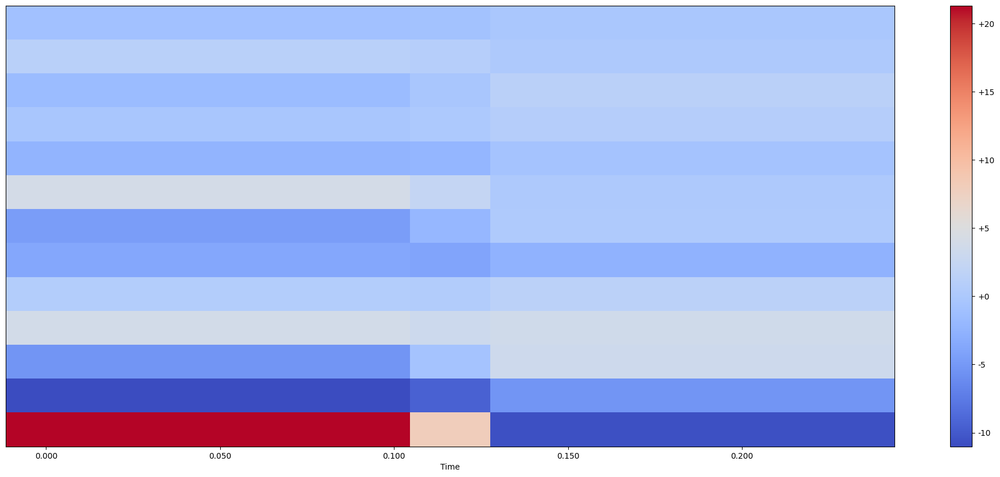

In [532]:
plt.figure(figsize=(25, 10))
librosa.display.specshow(delta_mfccs_duck_trimmed, 
                         x_axis="time", 
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()

In [ ]:
# The first MFCC on the bottom row is the energy coefficient, C0, and duck quacks show a consistent
# pattern where the sound starts quiet, builds to a higher energy, then tapers off. 
# So in the first MFCC plot, the sound is visibly quiet (darker blue), gets louder (lighter blue), 
# then quieter again (darker blue)
# in the second MFCC delta plot, it shows the changes from frame-to-frame. The red shows that the 
# number is increasing over time, (as the duck quack increases in volume) while the blue shows it's
# decreasing over time (as the duck quack tapers off)
# The other MFCCs describe other aspects of the signal, and in the case of the duck quack, they show
# less change over time

In [ ]:
## Extract spectral centroid and bandwidth

In [561]:
FRAME_SIZE = 2048
HOP_LENGTH = 512

In [562]:
# Calculate spectral centroid
sc_duck_trimmed = librosa.feature.spectral_centroid(y=duck_trimmed, sr=sr_duck, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [563]:
# Calculate spectral bandwidth
sban_duck_trimmed = librosa.feature.spectral_bandwidth(y=duck_trimmed, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [566]:
frames = range(len(sc_duck_trimmed))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

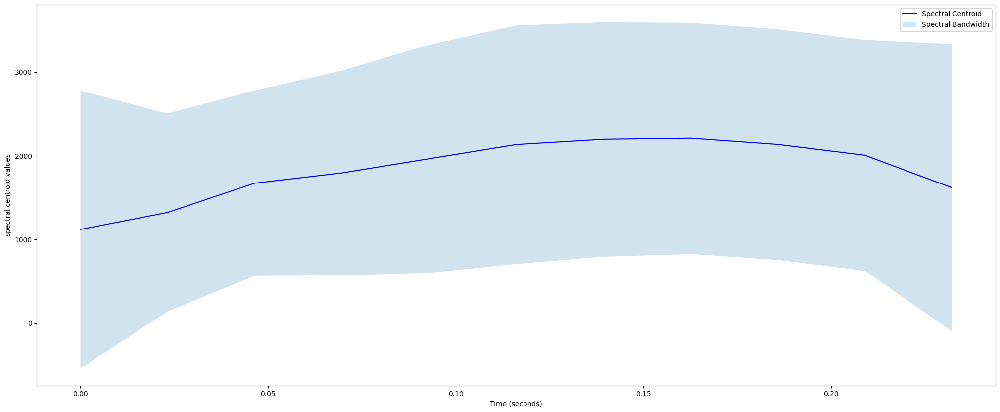

In [567]:
# Calculate upper and lower bounds
upper = np.array(sc_duck_trimmed) + np.array(sban_duck_trimmed)
lower = np.array(sc_duck_trimmed) - np.array(sban_duck_trimmed)

plt.figure(figsize=(25,10))
plt.plot(t, sc_duck_trimmed, color='b', label='Spectral Centroid')
plt.fill_between(t, upper, lower, alpha=0.2, label='Spectral Bandwidth')
plt.xlabel('Time (seconds)')
plt.ylabel('spectral centroid values')
plt.legend()
plt.show()

In [ ]:
# Shows a duck quack starts at a lower avg frequency, rises, then falls with pretty consistent bandwidth

In [ ]:
## Save new signals as wav files for future use

In [608]:
sf.write('bat_high_freq_only.wav', bat_filtered, sr_bat)
sf.write('duck_quack.wav', duck_trimmed, sr_duck)